<a href="https://colab.research.google.com/github/romenmeitei/Forest-loss-in-Manipur/blob/main/Forest_Loss_in_Manipur.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install earthengine-api
import ee
ee.Authenticate()
ee.Initialize(project='woven-name-441217-g5')


In [2]:
manipur = ee.FeatureCollection("FAO/GAUL/2015/level1") \
             .filter(ee.Filter.eq('ADM1_NAME', 'Manipur'))


In [3]:
# Load Hansen Global Forest Change dataset
gfc2023 = ee.Image("UMD/hansen/global_forest_change_2023_v1_11")


/usr/local/lib/python3.11/dist-packages/ee/deprecation.py:207: DeprecationWarning: 

Attention required for UMD/hansen/global_forest_change_2023_v1_11! You are using a deprecated asset.
To make sure your code keeps working, please update it.
Learn more: https://developers.google.com/earth-engine/datasets/catalog/UMD_hansen_global_forest_change_2023_v1_11

  warnings.warn(warning, category=DeprecationWarning)


In [4]:
# Extract bands
tree_cover_2000 = gfc2023.select('treecover2000').clip(manipur)
forest_loss = gfc2023.select('loss').clip(manipur)
loss_year = gfc2023.select('lossyear').clip(manipur)
forest_gain = gfc2023.select('gain').clip(manipur)

In [5]:
# Define a function to calculate forest loss per year in hectares
def calculate_loss_by_year(gfc2023, manipul_region):
    # Get the 'lossyear' band (year of forest loss)
    loss_year = gfc2023.select('lossyear').clip(manipul_region)

    # Get unique years of forest loss (1-22 corresponds to 2001-2022)
    years = ee.List.sequence(1, 22)

    # Function to calculate forest loss for a specific year (in hectares)
    def loss_for_year(year):
        # Mask pixels where the loss year is equal to the current year
        year_loss = loss_year.eq(ee.Image.constant(year))  # Corrected to use ee.Image.constant(year)

        # Calculate the area (in square meters) of forest loss in that year
        loss_area = year_loss.multiply(ee.Image.pixelArea())  # area in square meters

        # Convert square meters to hectares (1 hectare = 10,000 m²)
        loss_area_hectares = loss_area.divide(10000)  # convert to hectares

        # Sum the area of loss (in hectares)
        area_loss = loss_area_hectares.reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=manipul_region,  # region to compute area
            scale=30,  # Landsat resolution
            maxPixels=1e8
        )

        # Get the total area lost for this year
        return area_loss.get('lossyear')

    # Apply the function to each year
    loss_by_year = years.map(lambda year: loss_for_year(year))

    # Return the result as a dictionary of year-to-loss area
    return loss_by_year

# Call the function
loss_per_year = calculate_loss_by_year(gfc2023, manipur)

# Print the result (loss per year in hectares)
print('Forest Loss by Year (in hectares):', loss_per_year.getInfo())


Forest Loss by Year (in hectares): [4522.879411063588, 4333.552566392671, 5031.105034297138, 5379.445903605981, 4999.258567873167, 5479.673478043592, 4377.484398610886, 6001.130093245657, 6303.824460908042, 4417.219598066817, 6520.725518362592, 9427.414618716271, 14568.34492432137, 19353.30095588985, 18388.22395449982, 25567.052552369787, 23567.635578055895, 18197.99730003149, 17230.736020019773, 19584.500312902852, 20625.842037198385, 15650.482930545877]


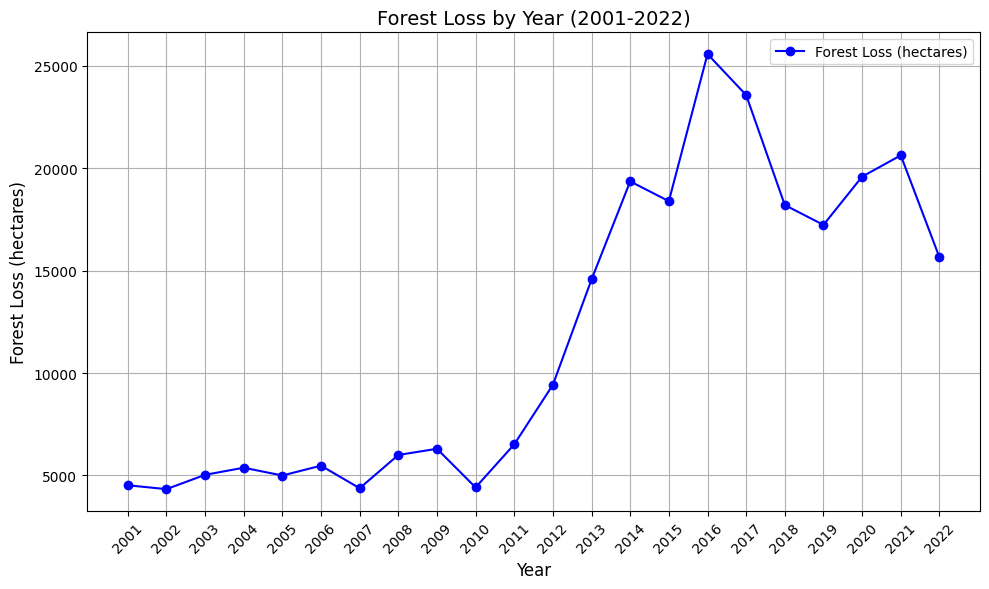

In [6]:
import matplotlib.pyplot as plt

# Year range from 2001 to 2022
years = list(range(2001, 2023))

# Forest loss values (in hectares)
loss_values = [4522.88, 4333.55, 5031.11, 5379.45, 4999.26, 5479.67, 4377.48, 6001.13,
               6303.82, 4417.22, 6520.73, 9427.41, 14568.34, 19353.30, 18388.22, 25567.05,
               23567.64, 18197.99, 17230.74, 19584.50, 20625.84, 15650.48]

# Plotting the data
plt.figure(figsize=(10, 6))
plt.plot(years, loss_values, marker='o', color='b', label='Forest Loss (hectares)')
plt.title('Forest Loss by Year (2001-2022)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Forest Loss (hectares)', fontsize=12)
plt.grid(True)
plt.xticks(years, rotation=45)
plt.tight_layout()
plt.legend()
plt.show()


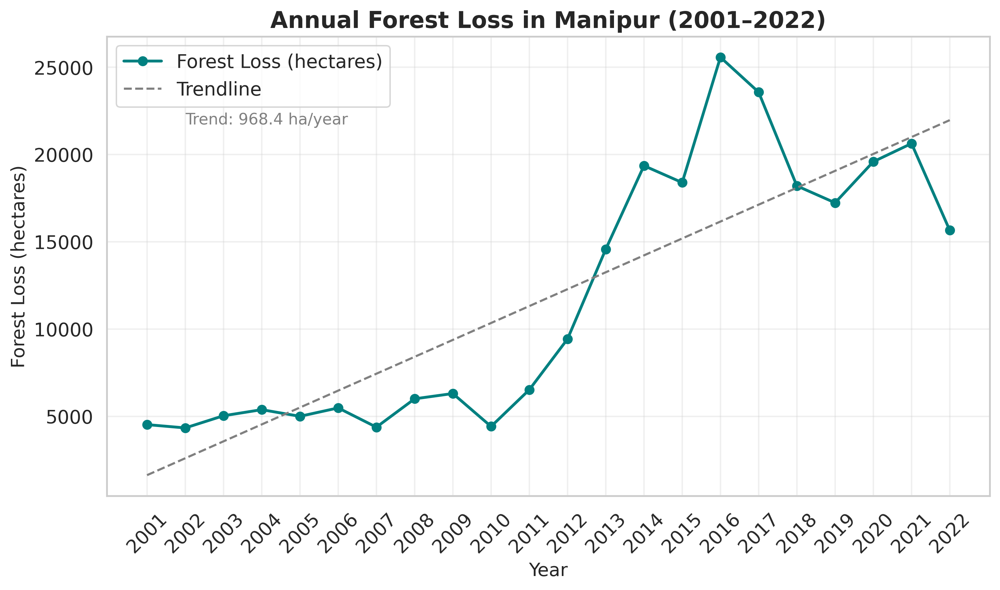

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Data
years = list(range(2001, 2023))
loss_values = [4522.88, 4333.55, 5031.11, 5379.45, 4999.26, 5479.67, 4377.48, 6001.13,
               6303.82, 4417.22, 6520.73, 9427.41, 14568.34, 19353.30, 18388.22, 25567.05,
               23567.64, 18197.99, 17230.74, 19584.50, 20625.84, 15650.48]

# Optional: linear regression fit
z = np.polyfit(years, loss_values, 1)
p = np.poly1d(z)
trendline = p(years)

# Style
sns.set(style='whitegrid', font_scale=1.2)
plt.figure(figsize=(10, 6), dpi=300)

# Plot line and trendline
plt.plot(years, loss_values, marker='o', color='teal', linewidth=2, label='Forest Loss (hectares)')
plt.plot(years, trendline, linestyle='--', color='gray', linewidth=1.5, label='Trendline')

# Titles and labels
plt.title('Annual Forest Loss in Manipur (2001–2022)', fontsize=16, weight='bold')
plt.xlabel('Year', fontsize=13)
plt.ylabel('Forest Loss (hectares)', fontsize=13)

# Axis ticks and layout
plt.xticks(years, rotation=45)
plt.tight_layout()
plt.grid(True, alpha=0.3)
plt.legend()

# Optional annotation of trend
slope = z[0]
plt.text(2002, max(loss_values) * 0.85, f"Trend: {slope:.1f} ha/year", fontsize=11, color='gray')

# Save as PDF or PNG for publication
plt.savefig("forest_loss_trend_2001_2022.pdf", format='pdf', bbox_inches='tight')  # or use 'png'
plt.show()


In [9]:
pip install openpyxl

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

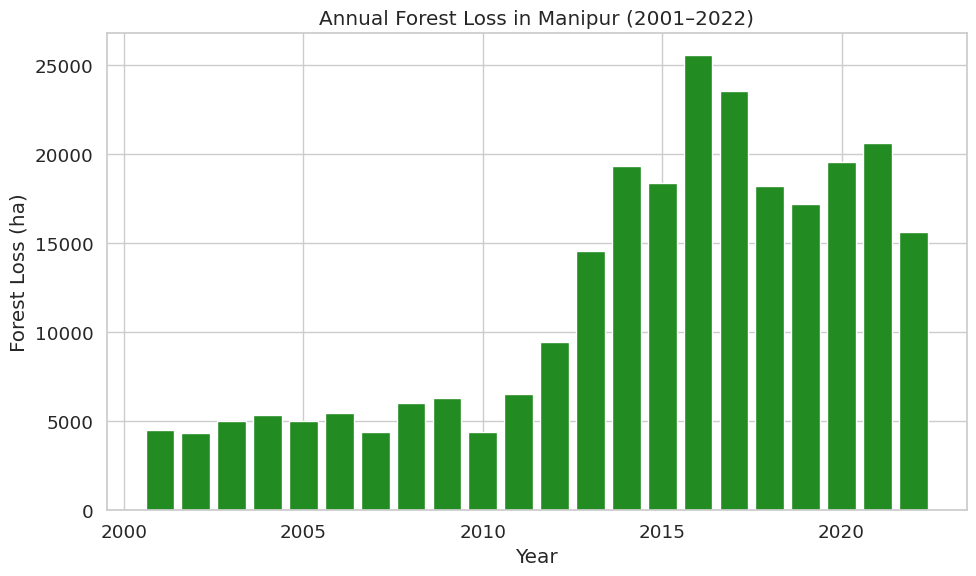

In [10]:
# Your function and variables assumed to be already defined:
loss_per_year = calculate_loss_by_year(gfc2023, manipur)
import pandas as pd

# Convert EE list to Python list
years = list(range(2001, 2023))  # Since 1-22 corresponds to 2001-2022
loss_values = loss_per_year.getInfo()

# Create DataFrame
df = pd.DataFrame({
    'Year': years,
    'Forest_Loss_ha': loss_values
})

# Export to Excel
df.to_excel("forest_loss_by_year.xlsx", index=False)

# Optional: Download link if running in Colab
from google.colab import files
files.download("forest_loss_by_year.xlsx")
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(df['Year'], df['Forest_Loss_ha'], color='forestgreen')
plt.xlabel('Year')
plt.ylabel('Forest Loss (ha)')
plt.title('Annual Forest Loss in Manipur (2001–2022)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [12]:
pip install geopandas

In [14]:
import geopandas as gpd

# Load the full India shapefile (adjust path accordingly)
gdf = gpd.read_file('/content/geoBoundaries-IND-ADM2_simplified.geojson')

# List of Manipur districts (adjust if you have exact district names in your file)
manipur_districts = [
    'Ukhrul', 'Thoubal', 'Tengnoupal', 'Tamenglong', 'Senapati', 'Pherzawl',
    'Noney', 'Kangpokpi', 'Kamjong', 'Kakching', 'Jiribam', 'Imphal West',
    'Imphal East', 'Churachandpur', 'Chandel', 'Bishnupur'
]

# Check which column contains district names; here I assume it's 'shapeName'
print(gdf.columns)  # Just to check column names

# Filter GeoDataFrame to only Manipur districts
manipur_gdf = gdf[gdf['shapeName'].isin(manipur_districts)]

# Save filtered Manipur districts GeoJSON for Earth Engine upload or direct use
manipur_gdf.to_file('/content/manipur_districts.geojson', driver='GeoJSON')

print(f"Filtered Manipur districts: {len(manipur_gdf)} features")


Index(['shapeName', 'shapeISO', 'shapeID', 'shapeGroup', 'shapeType',
       'geometry'],
      dtype='object')
Filtered Manipur districts: 16 features


In [15]:
#Year 2000
import ee
import json
import pandas as pd

# Load filtered Manipur districts GeoJSON
with open('/content/manipur_districts.geojson') as f:
    manipur_geojson = json.load(f)

# Convert GeoJSON to Earth Engine FeatureCollection
districts = ee.FeatureCollection(manipur_geojson)

# Load Global Forest Change dataset
gfc2023 = ee.Image('UMD/hansen/global_forest_change_2023_v1_11')
loss_year = gfc2023.select('lossyear')

# Specify the year of interest, e.g. 2001 corresponds to 1 in dataset
target_year = 1  # for 2001

def district_loss_for_year(feature):
    year_loss = loss_year.eq(ee.Image.constant(target_year))
    loss_area = year_loss.multiply(ee.Image.pixelArea()).divide(10000)  # hectares

    loss_sum = loss_area.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=feature.geometry(),
        scale=30,
        maxPixels=1e9
    ).get('lossyear')

    loss_sum = ee.Algorithms.If(loss_sum, loss_sum, 0)

    return feature.set({'loss_for_year': loss_sum})

# Map the function over districts
districts_with_loss = districts.map(district_loss_for_year)

# Get the data to client side
features = districts_with_loss.getInfo()['features']

# Parse data into list of dicts for pandas
data = []
for f in features:
    props = f['properties']
    name = props.get('shapeName', 'Unknown')
    loss = props.get('loss_for_year', 0)
    data.append({'district': name, 'loss_2001_ha': loss})

# Create pandas DataFrame
df = pd.DataFrame(data)

print(df.head())

# Export to Excel if needed
df.to_excel("manipur_forest_loss_2001_by_district.xlsx", index=False)


        district  loss_2001_ha
0        Chandel    463.788833
1     Tamenglong    944.251076
2         Ukhrul    166.051392
3      Bishnupur      2.120999
4  Churachandpur    704.721456


In [16]:
!pip install folium

import ee
import json
import pandas as pd
import folium



# Load filtered Manipur districts GeoJSON
with open('/content/manipur_districts.geojson') as f:
    manipur_geojson = json.load(f)

districts = ee.FeatureCollection(manipur_geojson)

gfc2023 = ee.Image('UMD/hansen/global_forest_change_2023_v1_11')
loss_year = gfc2023.select('lossyear')

target_year = 1  # 1 corresponds to 2001 (dataset start year)

def district_loss_for_year(feature):
    year_loss = loss_year.eq(ee.Image.constant(target_year))
    loss_area = year_loss.multiply(ee.Image.pixelArea()).divide(10000)  # hectares

    loss_sum = loss_area.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=feature.geometry(),
        scale=30,
        maxPixels=1e9
    ).get('lossyear')

    loss_sum = ee.Algorithms.If(loss_sum, loss_sum, 0)

    return feature.set({'loss_for_year': loss_sum})

districts_with_loss = districts.map(district_loss_for_year)

# Get GeoJSON with the added property
geojson = districts_with_loss.getInfo()

# Create pandas DataFrame for tabular view
data = []
for f in geojson['features']:
    props = f['properties']
    data.append({
        'district': props['shapeName'],
        'loss_2001_ha': float(props.get('loss_for_year', 0))
    })

df = pd.DataFrame(data)
print(df)

# Folium map visualization
m = folium.Map(location=[24.8, 94], zoom_start=8)

def style_function(feature):
    loss = feature['properties'].get('loss_for_year', 0)
    loss = float(loss)
    if loss == 0:
        color = '#ffffff'  # no loss white
    elif loss < 10:
        color = '#ffcccc'
    elif loss < 50:
        color = '#ff6666'
    else:
        color = '#990000'
    return {
        'fillOpacity': 0.7,
        'weight': 1,
        'color': 'black',
        'fillColor': color
    }

folium.GeoJson(
    geojson,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=['shapeName', 'loss_for_year'],
                                  aliases=['District:', 'Forest Loss (ha):'])
).add_to(m)

m.save('manipur_forest_loss_2001_map.html')


         district  loss_2001_ha
0         Chandel    463.788833
1      Tamenglong    944.251076
2          Ukhrul    166.051392
3       Bishnupur      2.120999
4   Churachandpur    704.721456
5         Thoubal      1.872527
6     Imphal East      9.661907
7       Kangpokpi    126.097395
8     Imphal West      4.874304
9        Pherzawl    569.909594
10          Noney    122.748309
11     Tengnoupal    344.219174
12        Kamjong    820.905856
13       Senapati    201.636664
14       Kakching     24.792400
15        Jiribam     11.772704


In [17]:
!pip install folium

import ee
import json
import pandas as pd
import folium

# Load districts GeoJSON
with open('/content/manipur_districts.geojson') as f:
    manipur_geojson = json.load(f)

# Base FeatureCollection
districts = ee.FeatureCollection(manipur_geojson)
gfc2023 = ee.Image('UMD/hansen/global_forest_change_2023_v1_11')
loss_year = gfc2023.select('lossyear')

# Dictionary to store results
yearly_data = {}

for year in range(2001, 2024):
    print(f"📊 Processing year: {year}")
    target = year - 2000
    def district_loss(feature):
        year_loss = loss_year.eq(target)
        loss_area = year_loss.multiply(ee.Image.pixelArea()).divide(10000)
        loss_sum = loss_area.reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=feature.geometry(),
            scale=30,
            maxPixels=1e9
        ).get('lossyear')
        return feature.set({f'loss_{year}': ee.Algorithms.If(loss_sum, loss_sum, 0)})

    yearly_data[year] = districts.map(district_loss)

# Merge all yearly data by matching 'shapeName'
# Start with 2001
combined = yearly_data[2001]

for year in range(2002, 2024):
    current = yearly_data[year]

    # Join on 'shapeName'
    join = ee.Join.inner()
    filter = ee.Filter.equals(leftField='shapeName', rightField='shapeName')
    joined = join.apply(combined, current, filter)

    def merge_joined_features(joined_feature):
        left = ee.Feature(joined_feature.get('primary'))
        right = ee.Feature(joined_feature.get('secondary'))
        merged = left.copyProperties(right)
        return merged

    combined = ee.FeatureCollection(joined.map(merge_joined_features))

# Download as GeoJSON
geojson = combined.getInfo()

# Convert to DataFrame
data = []
for f in geojson['features']:
    props = f['properties']
    row = {'district': props['shapeName']}
    for year in range(2001, 2024):
        row[f'loss_{year}'] = float(props.get(f'loss_{year}', 0))
    data.append(row)

df = pd.DataFrame(data)
print(df)

# Save output
df.to_csv("manipur_forest_loss_2001_2023.csv", index=False)


📊 Processing year: 2001
📊 Processing year: 2002
📊 Processing year: 2003
📊 Processing year: 2004
📊 Processing year: 2005
📊 Processing year: 2006
📊 Processing year: 2007
📊 Processing year: 2008
📊 Processing year: 2009
📊 Processing year: 2010
📊 Processing year: 2011
📊 Processing year: 2012
📊 Processing year: 2013
📊 Processing year: 2014
📊 Processing year: 2015
📊 Processing year: 2016
📊 Processing year: 2017
📊 Processing year: 2018
📊 Processing year: 2019
📊 Processing year: 2020
📊 Processing year: 2021
📊 Processing year: 2022
📊 Processing year: 2023
         district   loss_2001   loss_2002    loss_2003    loss_2004  \
0         Chandel  463.788833  588.571328   679.031410   578.404600   
1      Tamenglong  944.251076  823.292018   856.612786   705.770289   
2          Ukhrul  166.051392  106.073279   124.186206   202.720903   
3       Bishnupur    2.120999   13.289104    29.132804    28.528014   
4   Churachandpur  704.721456  718.997048   655.707017   765.325278   
5         Thoubal    1

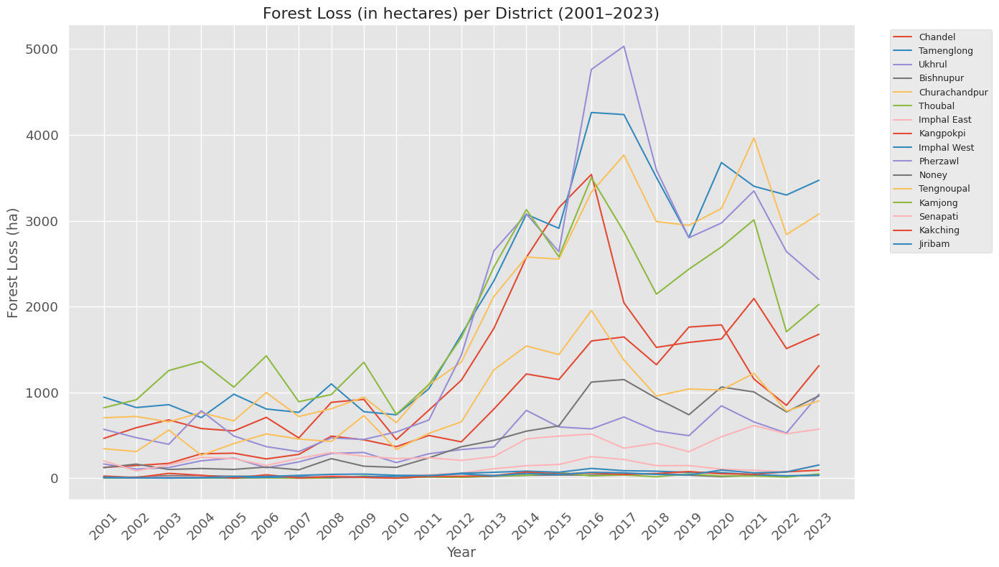

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('manipur_forest_loss_2001_2023.csv')

plt.style.use('ggplot')  # <- change from 'seaborn-whitegrid'
plt.figure(figsize=(14, 8))

for i, row in df.iterrows():
    district = row['district']
    losses = row[1:]  # Skip 'district'
    plt.plot(losses.index.str.replace('loss_', ''), losses.values, label=district)

plt.title('Forest Loss (in hectares) per District (2001–2023)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Forest Loss (ha)', fontsize=14)
plt.xticks(rotation=45)
plt.legend(loc='upper right', bbox_to_anchor=(1.18, 1), ncol=1, fontsize=9)
plt.tight_layout()
plt.show()


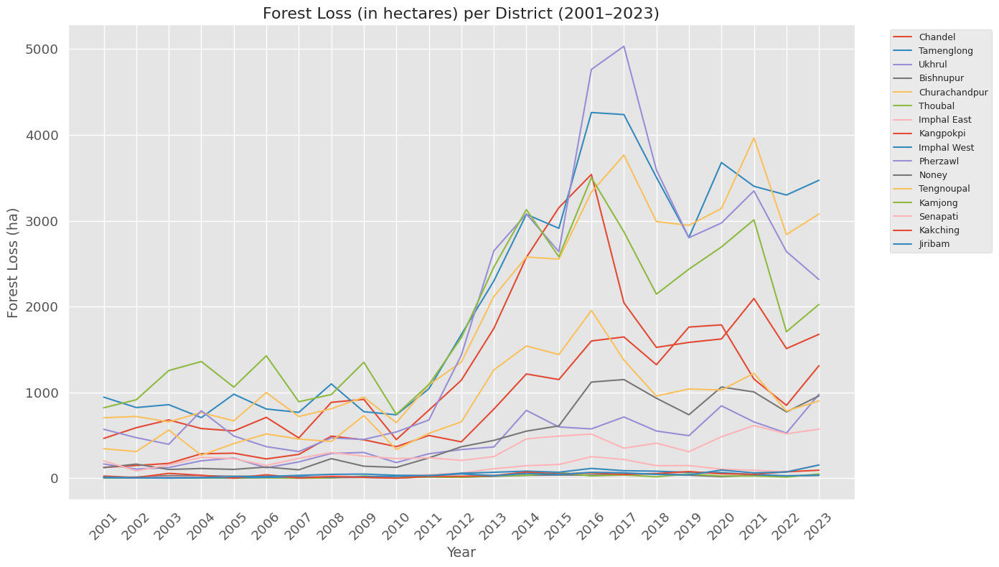

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('manipur_forest_loss_2001_2023.csv')

plt.style.use('ggplot')  # <- change from 'seaborn-whitegrid'
plt.figure(figsize=(14, 8))

for i, row in df.iterrows():
    district = row['district']
    losses = row[1:]  # Skip 'district'
    plt.plot(losses.index.str.replace('loss_', ''), losses.values, label=district)

plt.title('Forest Loss (in hectares) per District (2001–2023)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Forest Loss (ha)', fontsize=14)
plt.xticks(rotation=45)
plt.legend(loc='upper right', bbox_to_anchor=(1.18, 1), ncol=1, fontsize=9)
plt.tight_layout()
plt.show()


In [20]:
!pip install statsmodels


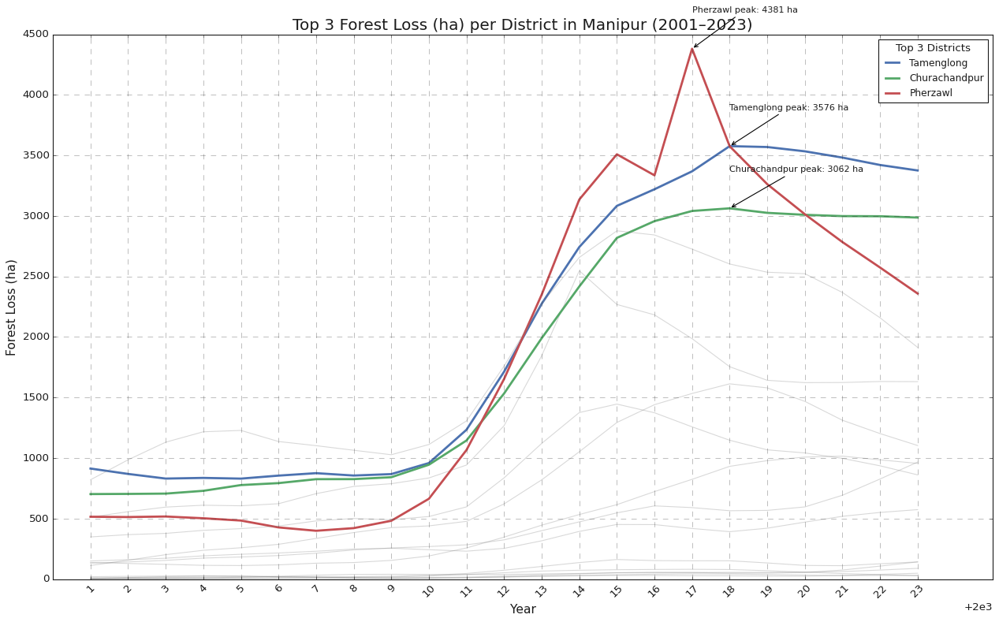

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess

# Read the CSV file
df = pd.read_csv('manipur_forest_loss_2001_2023.csv')

# Extract years from column names (assuming format loss_2001, loss_2002, ...)
year_columns = [col for col in df.columns if col.startswith('loss_')]
years = [int(col.split('_')[1]) for col in year_columns]

# Compute total loss per district to rank top 3
df['total_loss'] = df[year_columns].sum(axis=1)
top3_df = df.nlargest(3, 'total_loss')
top3_districts = top3_df['district'].tolist()

# Start figure with white background
plt.style.use('classic')  # Ensures white background
fig, ax = plt.subplots(figsize=(16, 10), facecolor='white')

# Plot each district
for i, row in df.iterrows():
    district = row['district']
    y_values = row[year_columns].values
    smoothed = lowess(y_values, years, frac=0.3, return_sorted=False)

    if district in top3_districts:
        ax.plot(years, smoothed, label=district, linewidth=2.5)

        # Annotate peak
        peak_year = years[np.argmax(smoothed)]
        peak_val = np.max(smoothed)
        ax.annotate(f'{district} peak: {int(peak_val)} ha',
                    xy=(peak_year, peak_val),
                    xytext=(peak_year, peak_val + 300),
                    fontsize=10,
                    arrowprops=dict(arrowstyle='->', color='black'))
    else:
        ax.plot(years, smoothed, color='gray', alpha=0.3)

# Title and labels
ax.set_title('Top 3 Forest Loss (ha) per District in Manipur (2001–2023)', fontsize=18)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Forest Loss (ha)', fontsize=14)
ax.set_xticks(years)
ax.tick_params(axis='x', rotation=45)

# Legend
ax.legend(title='Top 3 Districts', loc='upper right', fontsize=11, title_fontsize=12)

# Grid and layout
ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()


In [22]:
!pip install seaborn --quiet
import seaborn as sns
sns.set(style="whitegrid", palette="muted", font_scale=1.2)


In [23]:
import ee

# Load the global forest change image
gfc2023 = ee.Image('UMD/hansen/global_forest_change_2023_v1_11')
loss_year = gfc2023.select('lossyear')

# Select the year code for 2001
target_year = 1

# Create a binary mask of loss for the target year (1=2001)
loss_for_year = loss_year.eq(target_year)

# Optionally clip to Manipur boundary if you want smaller region (load your Manipur boundary as ee.Feature or ee.FeatureCollection)
# For example, assuming you have 'manipur_boundary' as an ee.Feature:
# loss_for_year = loss_for_year.clip(manipur_boundary.geometry())

# Define export parameters
export_region = loss_for_year.geometry().bounds().getInfo()['coordinates']  # or set a smaller bounding box

task = ee.batch.Export.image.toDrive(
    image=loss_for_year.toByte(),  # Convert boolean mask to byte image (0 or 1)
    description='Manipur_Forest_Loss_2001',
    folder='EarthEngineExports',  # Your Google Drive folder
    fileNamePrefix='manipur_forest_loss_2001',
    region=export_region,  # coordinates of area of interest
    scale=30,  # match dataset scale
    crs='EPSG:4326',
    maxPixels=1e13
)

task.start()
print("Export started. Check your Google Drive 'EarthEngineExports' folder for the file.")


Export started. Check your Google Drive 'EarthEngineExports' folder for the file.


In [24]:
# Load administrative boundaries (level 1 = states)
manipur = ee.FeatureCollection("FAO/GAUL/2015/level1") \
             .filter(ee.Filter.eq('ADM1_NAME', 'Manipur'))

# Optional: Check the area
manipur_area = manipur.geometry().area().divide(1e6)
print("Manipur area (sq.km):", manipur_area.getInfo())


Manipur area (sq.km): 22375.530373168065


In [25]:
# Load the Hansen GFC dataset
hansen = ee.Image("UMD/hansen/global_forest_change_2023_v1_11")

# Select relevant bands
treecover2000 = hansen.select('treecover2000').clip(manipur)
loss = hansen.select('loss').clip(manipur)
lossyear = hansen.select('lossyear').clip(manipur)


In [26]:
# Export treecover2000
task1 = ee.batch.Export.image.toDrive(
    image=treecover2000,
    description='Manipur_treecover2000',
    folder='GEE_Manipur',
    fileNamePrefix='treecover2000_Manipur',
    region=manipur.geometry(),
    scale=30,
    crs='EPSG:4326',
    maxPixels=1e13
)
task1.start()

# Export loss.tif
task2 = ee.batch.Export.image.toDrive(
    image=loss,
    description='Manipur_loss',
    folder='GEE_Manipur',
    fileNamePrefix='loss_Manipur',
    region=manipur.geometry(),
    scale=30,
    crs='EPSG:4326',
    maxPixels=1e13
)
task2.start()

# Export lossyear.tif
task3 = ee.batch.Export.image.toDrive(
    image=lossyear,
    description='Manipur_lossyear',
    folder='GEE_Manipur',
    fileNamePrefix='lossyear_Manipur',
    region=manipur.geometry(),
    scale=30,
    crs='EPSG:4326',
    maxPixels=1e13
)
task3.start()


In [27]:
!pip install geemap --quiet
import geemap
import ee
Map = geemap.Map(center=[24.6, 93.9], zoom=8)
Map.addLayer(treecover2000, {'min': 0, 'max': 100, 'palette': ['ffffff', '006400']}, 'Tree Cover 2000')
Map.addLayer(loss, {'min': 0, 'max': 1, 'palette': ['white', 'red']}, 'Loss')
Map.addLayer(lossyear, {'min': 1, 'max': 23, 'palette': ['yellow', 'orange', 'red']}, 'Loss Year')
Map.addLayer(manipur, {}, 'Manipur Boundary')
Map


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.8 MB/s eta 0:00:00


Map(center=[24.6, 93.9], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

In [28]:
# Clip each layer to Manipur again, just to be sure
treecover2000 = hansen.select('treecover2000').clip(manipur)
loss = hansen.select('loss').clip(manipur)
lossyear = hansen.select('lossyear').clip(manipur)


In [29]:
# Create interactive map
Map = geemap.Map(center=[24.6, 93.9], zoom=8)

# Tree Cover 2000 (0–100% cover)
treecover_vis = {
    'min': 0,
    'max': 100,
    'palette': ['white', 'green']
}

# Forest Loss (binary: 0 = no loss, 1 = loss)
loss_vis = {
    'min': 0,
    'max': 1,
    'palette': ['white', 'red']
}

# Loss Year (1 = 2001, ..., 23 = 2023)
lossyear_vis = {
    'min': 1,
    'max': 23,
    'palette': [
        'yellow', 'orange', 'red', 'darkred', 'brown', 'purple', 'blue', 'darkblue'
    ]
}

# Add layers
Map.addLayer(treecover2000, treecover_vis, 'Tree Cover 2000')
Map.addLayer(loss, loss_vis, 'Forest Loss (2001–2023)')
Map.addLayer(lossyear, lossyear_vis, 'Forest Loss Year (2001–2023)')
Map.addLayer(manipur, {}, 'Manipur Boundary')

Map


Map(center=[24.6, 93.9], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

In [30]:
# Check if Treecover has non-zero values
treecover_stats = treecover2000.reduceRegion(
    reducer=ee.Reducer.mean(),
    geometry=manipur.geometry(),
    scale=30,
    maxPixels=1e9
)

print("Average treecover2000:", treecover_stats.getInfo())


Average treecover2000: {'treecover2000': 61.40968404306711}


In [31]:
# Assuming you already have:
# - ee and geemap imported
# - Earth Engine initialized
# - manipur boundary loaded as 'manipur'
# - hansen image loaded and clipped, like:

hansen = ee.Image("UMD/hansen/global_forest_change_2023_v1_11")
lossyear = hansen.select('lossyear').clip(manipur)

# Create map centered on Manipur
Map = geemap.Map(center=[24.6, 93.9], zoom=8)

# Add Manipur boundary
Map.addLayer(manipur, {}, 'Manipur Boundary')

# Add yearly loss masks for 2001 to 2023
for year in range(1, 24):  # 1 = 2001, ..., 23 = 2023
    year_mask = lossyear.eq(year).selfMask()  # Mask everything except loss in that year
    vis = {'palette': ['red']}
    Map.addLayer(year_mask, vis, f'Forest loss {2000 + year}')

# Show the map (in Colab this displays automatically)
Map


Map(center=[24.6, 93.9], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

In [32]:
# Assuming EE, geemap initialized, manipur loaded, hansen image clipped to manipur as 'lossyear'

Map = geemap.Map(center=[24.6, 93.9], zoom=8)
Map.addLayer(manipur, {}, 'Manipur Boundary')

# Add yearly loss masks for 2014 to 2023 (lossyear uses values 14 to 23)
for year in range(14, 24):  # 2014 to 2023
    year_mask = lossyear.eq(year).selfMask()
    vis = {'palette': ['red']}
    Map.addLayer(year_mask, vis, f'Forest loss {2000 + year}')

# Display the map
Map


Map(center=[24.6, 93.9], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

In [33]:
for year in range(12, 24):  # years 2012 to 2023
    year_mask = lossyear.eq(year).selfMask()
    vis = {'palette': ['red']}
    Map.addLayer(year_mask, vis, f'Forest loss {2000 + year}')


In [34]:
!pip install folium

import ee
import json
import pandas as pd
import folium

# Load districts GeoJSON
with open('/content/manipur_districts.geojson') as f:
    manipur_geojson = json.load(f)

# Convert to EE FeatureCollection
districts = ee.FeatureCollection(manipur_geojson)

# Load forest loss image
gfc2023 = ee.Image('UMD/hansen/global_forest_change_2023_v1_11')
loss_year = gfc2023.select('lossyear')

# MODIS NDVI/EVI collection
modis = ee.ImageCollection("MODIS/006/MOD13Q1")

# Dictionary to hold per-year feature collections
yearly_data = {}

for year in range(2001, 2024):
    print(f"📊 Processing year: {year}")
    target = year - 2000

    def process_feature(feature):
        # Forest loss
        year_loss = loss_year.eq(target)
        loss_area = year_loss.multiply(ee.Image.pixelArea()).divide(10000)
        loss_sum = loss_area.reduceRegion(
            reducer=ee.Reducer.sum(),
            geometry=feature.geometry(),
            scale=30,
            maxPixels=1e9
        ).get('lossyear')

        # NDVI and EVI
        ndvi_evi_year = modis.filterDate(f'{year}-01-01', f'{year}-12-31') \
                             .select(['NDVI', 'EVI']) \
                             .mean()

        ndvi_mean = ndvi_evi_year.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=feature.geometry(),
            scale=250,
            maxPixels=1e9
        ).get('NDVI')

        evi_mean = ndvi_evi_year.reduceRegion(
            reducer=ee.Reducer.mean(),
            geometry=feature.geometry(),
            scale=250,
            maxPixels=1e9
        ).get('EVI')

        return feature.set({
            f'loss_{year}': ee.Algorithms.If(loss_sum, loss_sum, 0),
            f'ndvi_{year}': ee.Algorithms.If(ndvi_mean, ndvi_mean, 0),
            f'evi_{year}': ee.Algorithms.If(evi_mean, evi_mean, 0)
        })

    yearly_data[year] = districts.map(process_feature)

# Merge all years' feature collections by 'shapeName'
combined = yearly_data[2001]

for year in range(2002, 2024):
    current = yearly_data[year]
    join = ee.Join.inner()
    filter = ee.Filter.equals(leftField='shapeName', rightField='shapeName')
    joined = join.apply(combined, current, filter)

    def merge_joined_features(joined_feature):
        left = ee.Feature(joined_feature.get('primary'))
        right = ee.Feature(joined_feature.get('secondary'))
        merged = left.copyProperties(right)
        return merged

    combined = ee.FeatureCollection(joined.map(merge_joined_features))

# Export data to Python
geojson = combined.getInfo()

# Parse to DataFrame
data = []
for f in geojson['features']:
    props = f['properties']
    row = {'district': props['shapeName']}
    for year in range(2001, 2024):
        row[f'loss_{year}'] = float(props.get(f'loss_{year}', 0))
        row[f'ndvi_{year}'] = float(props.get(f'ndvi_{year}', 0)) / 10000  # scale factor
        row[f'evi_{year}'] = float(props.get(f'evi_{year}', 0)) / 10000
    data.append(row)

df = pd.DataFrame(data)
print(df.head())

# Save to CSV
df.to_csv("manipur_forest_loss_ndvi_evi_2001_2023.csv", index=False)


📊 Processing year: 2001
📊 Processing year: 2002
📊 Processing year: 2003
📊 Processing year: 2004
📊 Processing year: 2005
📊 Processing year: 2006
📊 Processing year: 2007
📊 Processing year: 2008
📊 Processing year: 2009
📊 Processing year: 2010
📊 Processing year: 2011
📊 Processing year: 2012
📊 Processing year: 2013
📊 Processing year: 2014
📊 Processing year: 2015
📊 Processing year: 2016
📊 Processing year: 2017
📊 Processing year: 2018
📊 Processing year: 2019
📊 Processing year: 2020
📊 Processing year: 2021
📊 Processing year: 2022
📊 Processing year: 2023
        district   loss_2001  ndvi_2001  evi_2001   loss_2002  ndvi_2002  \
0        Chandel  463.788833   0.620570  0.390505  588.571328   0.681855   
1     Tamenglong  944.251076   0.733247  0.465850  823.292018   0.720518   
2         Ukhrul  166.051392   0.608642  0.362987  106.073279   0.630117   
3      Bishnupur    2.120999   0.461093  0.271086   13.289104   0.480206   
4  Churachandpur  704.721456   0.670936  0.418924  718.997048   0.70

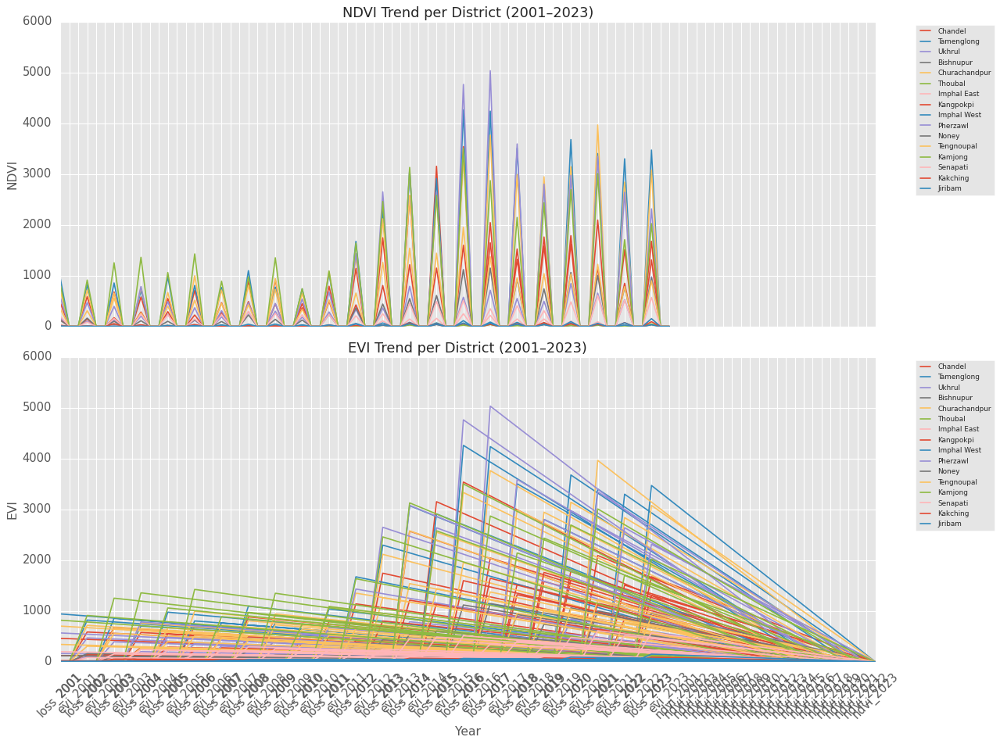

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the NDVI and EVI datasets (replace paths if needed)
ndvi_df = pd.read_csv('manipur_forest_loss_ndvi_evi_2001_2023.csv')
evi_df = pd.read_csv('manipur_forest_loss_ndvi_evi_2001_2023.csv')

# Plot settings
plt.style.use('ggplot')
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 12), sharex=True)

# --- NDVI Plot ---
for i, row in ndvi_df.iterrows():
    district = row['district']
    values = row[1:]  # skip district column
    axes[0].plot(values.index.str.replace('ndvi_', ''), values.values, label=district)

axes[0].set_title('NDVI Trend per District (2001–2023)', fontsize=16)
axes[0].set_ylabel('NDVI', fontsize=14)
axes[0].legend(loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=8)

# --- EVI Plot ---
for i, row in evi_df.iterrows():
    district = row['district']
    values = row[1:]  # skip district column
    axes[1].plot(values.index.str.replace('evi_', ''), values.values, label=district)

axes[1].set_title('EVI Trend per District (2001–2023)', fontsize=16)
axes[1].set_xlabel('Year', fontsize=14)
axes[1].set_ylabel('EVI', fontsize=14)
axes[1].legend(loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=8)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


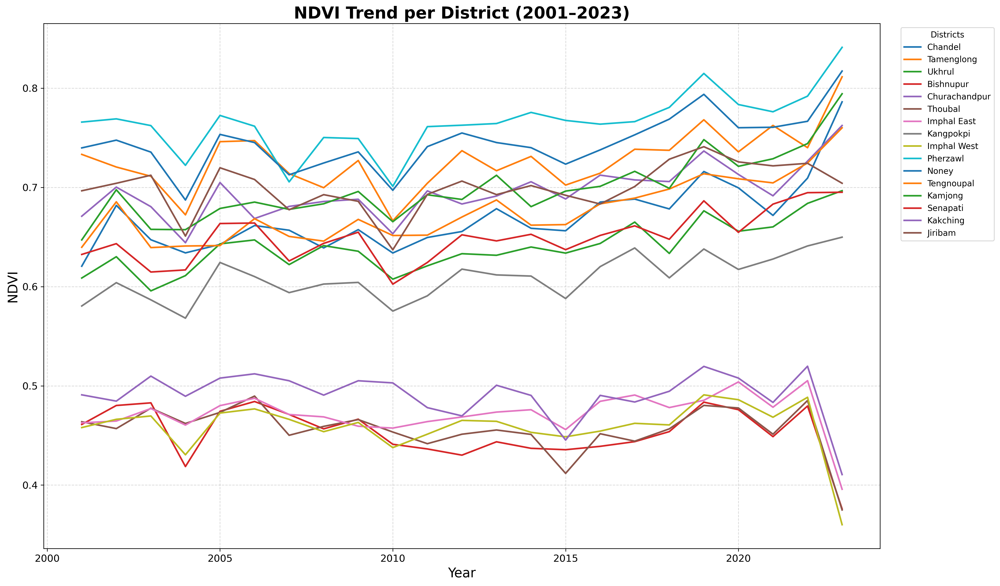

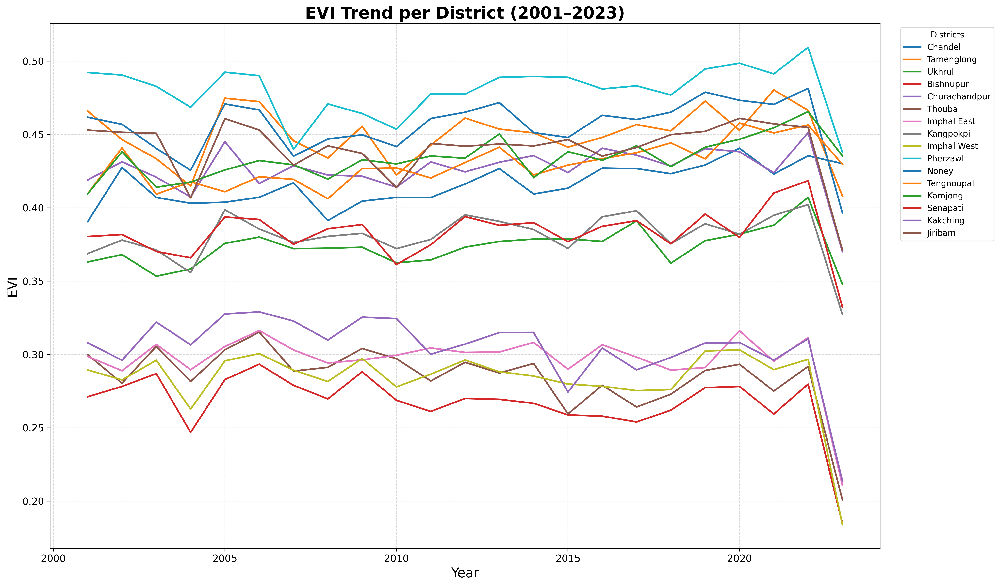

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('manipur_forest_loss_ndvi_evi_2001_2023.csv')

# Prepare long-format data
ndvi_cols = [col for col in df.columns if col.startswith('ndvi_')]
evi_cols = [col for col in df.columns if col.startswith('evi_')]

ndvi_long = df[['district'] + ndvi_cols].melt(id_vars='district', var_name='Year', value_name='NDVI')
ndvi_long['Year'] = ndvi_long['Year'].str.replace('ndvi_', '').astype(int)

evi_long = df[['district'] + evi_cols].melt(id_vars='district', var_name='Year', value_name='EVI')
evi_long['Year'] = evi_long['Year'].str.replace('evi_', '').astype(int)

# ==========================
# 1️⃣ NDVI Trend Plot
# ==========================
plt.style.use('default')  # clean white style

fig_ndvi, ax_ndvi = plt.subplots(figsize=(20, 10), dpi=300)

for district in ndvi_long['district'].unique():
    subset = ndvi_long[ndvi_long['district'] == district]
    ax_ndvi.plot(subset['Year'], subset['NDVI'], label=district, linewidth=2)

ax_ndvi.set_title('NDVI Trend per District (2001–2023)', fontsize=20, fontweight='bold')
ax_ndvi.set_xlabel('Year', fontsize=16)
ax_ndvi.set_ylabel('NDVI', fontsize=16)
ax_ndvi.tick_params(axis='both', labelsize=12)
ax_ndvi.grid(True, linestyle='--', alpha=0.5)

# Optional: move legend outside
ax_ndvi.legend(title='Districts', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)
fig_ndvi.tight_layout(rect=[0, 0, 0.85, 1])
fig_ndvi.savefig('NDVI_Trend_per_District.png')  # save as image

plt.show()


# ==========================
# 2️⃣ EVI Trend Plot
# ==========================
fig_evi, ax_evi = plt.subplots(figsize=(20, 10), dpi=300)

for district in evi_long['district'].unique():
    subset = evi_long[evi_long['district'] == district]
    ax_evi.plot(subset['Year'], subset['EVI'], label=district, linewidth=2)

ax_evi.set_title('EVI Trend per District (2001–2023)', fontsize=20, fontweight='bold')
ax_evi.set_xlabel('Year', fontsize=16)
ax_evi.set_ylabel('EVI', fontsize=16)
ax_evi.tick_params(axis='both', labelsize=12)
ax_evi.grid(True, linestyle='--', alpha=0.5)

# Optional: move legend outside
ax_evi.legend(title='Districts', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)
fig_evi.tight_layout(rect=[0, 0, 0.85, 1])
fig_evi.savefig('EVI_Trend_per_District.png')  # save as image

plt.show()


In [39]:
from scipy.stats import linregress

for district in ndvi_long['district'].unique():
    subset = ndvi_long[ndvi_long['district'] == district]
    slope, intercept, r_value, p_value, std_err = linregress(subset['Year'], subset['NDVI'])
    print(f"{district}: NDVI trend slope = {slope:.4f}, p = {p_value:.4f}")


Chandel: NDVI trend slope = 0.0038, p = 0.0001
Tamenglong: NDVI trend slope = 0.0023, p = 0.0115
Ukhrul: NDVI trend slope = 0.0029, p = 0.0000
Bishnupur: NDVI trend slope = -0.0012, p = 0.1473
Churachandpur: NDVI trend slope = 0.0027, p = 0.0002
Thoubal: NDVI trend slope = -0.0012, p = 0.1342
Imphal East: NDVI trend slope = 0.0002, p = 0.7667
Kangpokpi: NDVI trend slope = 0.0023, p = 0.0001
Imphal West: NDVI trend slope = -0.0004, p = 0.6320
Pherzawl: NDVI trend slope = 0.0026, p = 0.0030
Noney: NDVI trend slope = 0.0026, p = 0.0016
Tengnoupal: NDVI trend slope = 0.0039, p = 0.0000
Kamjong: NDVI trend slope = 0.0041, p = 0.0000
Senapati: NDVI trend slope = 0.0024, p = 0.0005
Kakching: NDVI trend slope = -0.0009, p = 0.2333
Jiribam: NDVI trend slope = 0.0014, p = 0.0504


In [40]:
from scipy.stats import f_oneway

groups = [ndvi_long[ndvi_long['district'] == d]['NDVI'] for d in ndvi_long['district'].unique()]
f_val, p_val = f_oneway(*groups)
print(f"ANOVA F={f_val:.2f}, p={p_val:.4e}")


ANOVA F=397.83, p=3.1168e-210


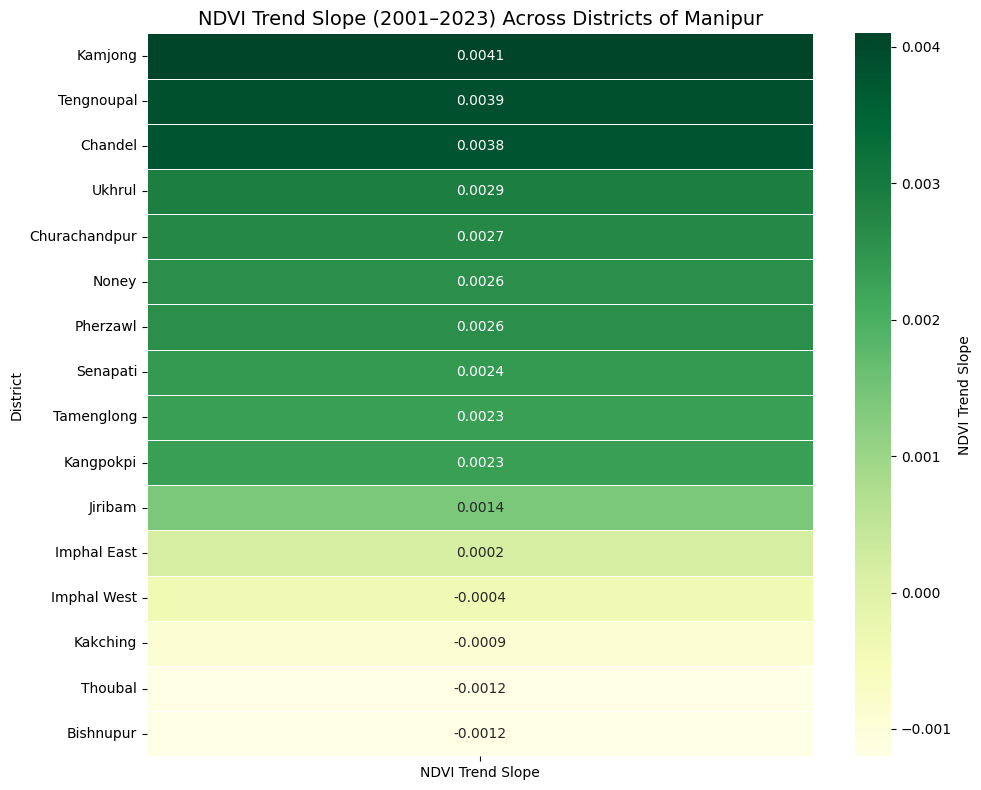

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# NDVI trend slopes per district (from your analysis)
ndvi_trends = {
    'Chandel': 0.0038,
    'Tamenglong': 0.0023,
    'Ukhrul': 0.0029,
    'Bishnupur': -0.0012,
    'Churachandpur': 0.0027,
    'Thoubal': -0.0012,
    'Imphal East': 0.0002,
    'Kangpokpi': 0.0023,
    'Imphal West': -0.0004,
    'Pherzawl': 0.0026,
    'Noney': 0.0026,
    'Tengnoupal': 0.0039,
    'Kamjong': 0.0041,
    'Senapati': 0.0024,
    'Kakching': -0.0009,
    'Jiribam': 0.0014
}

# Create DataFrame
df_heatmap = pd.DataFrame.from_dict(ndvi_trends, orient='index', columns=['NDVI Trend Slope'])
df_heatmap.index.name = 'District'

# Sort for better visual structure (optional)
df_heatmap = df_heatmap.sort_values(by='NDVI Trend Slope', ascending=False)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_heatmap, cmap='YlGn', annot=True, fmt=".4f", linewidths=0.5, cbar_kws={'label': 'NDVI Trend Slope'})
plt.title('NDVI Trend Slope (2001–2023) Across Districts of Manipur', fontsize=14)
plt.xlabel('')  # No need to show 'NDVI Trend Slope' as x-label
plt.ylabel('District')

# Export as high-resolution PDF
plt.tight_layout()
plt.savefig('ndvi_trend_slope_heatmap.pdf', format='pdf', dpi=300)
plt.show()


In [41]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

tukey = pairwise_tukeyhsd(endog=ndvi_long['NDVI'], groups=ndvi_long['district'], alpha=0.05)
print(tukey.summary())


       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1        group2    meandiff p-adj   lower   upper  reject
------------------------------------------------------------------
    Bishnupur       Chandel   0.2168    0.0  0.1891  0.2446   True
    Bishnupur Churachandpur   0.2425    0.0  0.2147  0.2703   True
    Bishnupur   Imphal East   0.0186 0.6118 -0.0091  0.0464  False
    Bishnupur   Imphal West   0.0056    1.0 -0.0222  0.0333  False
    Bishnupur       Jiribam   0.2469    0.0  0.2192  0.2747   True
    Bishnupur      Kakching   0.0379 0.0004  0.0101  0.0657   True
    Bishnupur       Kamjong   0.2456    0.0  0.2178  0.2733   True
    Bishnupur     Kangpokpi   0.1561    0.0  0.1283  0.1839   True
    Bishnupur         Noney   0.2922    0.0  0.2644    0.32   True
    Bishnupur      Pherzawl   0.3125    0.0  0.2848  0.3403   True
    Bishnupur      Senapati   0.1969    0.0  0.1691  0.2247   True
    Bishnupur    Tamenglong   0.2746    0.0  0.2468  0.3024   

In [43]:
merged = pd.merge(ndvi_long, evi_long, on=['district', 'Year'])
correlation = merged[['NDVI', 'EVI']].corr()
print(correlation)


         NDVI      EVI
NDVI  1.00000  0.96649
EVI   0.96649  1.00000


type   district  year       evi       loss      ndvi
0     Bishnupur  2001  0.271086   2.120999  0.461093
1     Bishnupur  2002  0.278130  13.289104  0.480206
2     Bishnupur  2003  0.286886  29.132804  0.482856
3     Bishnupur  2004  0.246769  28.528014  0.418699
4     Bishnupur  2005  0.282829  22.493176  0.474341
🔗 Correlation Matrix:
 type      loss      ndvi       evi
type                              
loss  1.000000  0.572647  0.546294
ndvi  0.572647  1.000000  0.966490
evi   0.546294  0.966490  1.000000


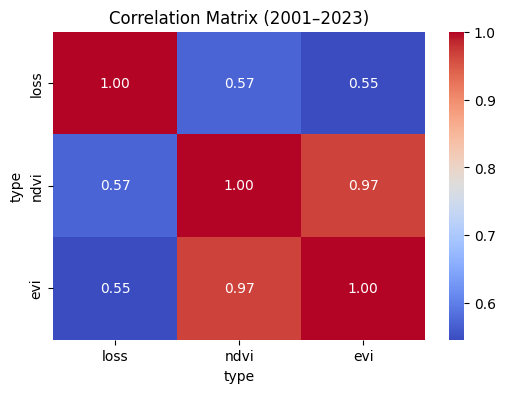

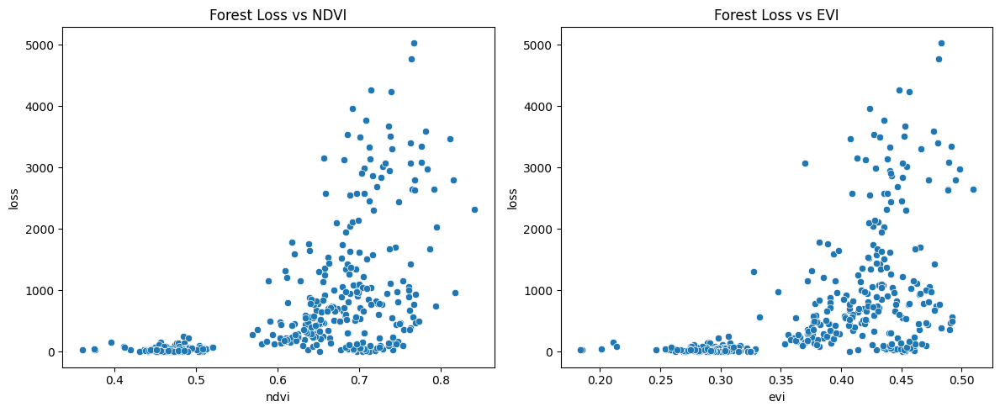

In [58]:
# 📦 Load CSV
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace this with your actual file name if needed
df = pd.read_csv('manipur_forest_loss_ndvi_evi_2001_2023.csv')

# 🔄 Convert wide format to long format for analysis
df_long = df.melt(id_vars='district', var_name='variable', value_name='value')

# 📤 Extract year and type (loss, ndvi, evi) from column names
df_long['type'] = df_long['variable'].str.extract(r'([a-z]+)')
df_long['year'] = df_long['variable'].str.extract(r'(\d+)').astype(int)

# 🔄 Pivot so each row = district + year, and columns = loss, ndvi, evi
df_pivot = df_long.pivot_table(index=['district', 'year'], columns='type', values='value').reset_index()

# 🔍 Show sample
print(df_pivot.head())

# 📈 Correlation matrix
corr = df_pivot[['loss', 'ndvi', 'evi']].corr()
print("🔗 Correlation Matrix:\n", corr)

# 🔥 Heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix (2001–2023)")
plt.show()

# 📊 Scatter plots for visual correlation
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(data=df_pivot, x='ndvi', y='loss')
plt.title("Forest Loss vs NDVI")

plt.subplot(1, 2, 2)
sns.scatterplot(data=df_pivot, x='evi', y='loss')
plt.title("Forest Loss vs EVI")

plt.tight_layout()
plt.show()


In [59]:
# District-wise correlation between forest loss and NDVI
district_corrs = df_pivot.groupby('district')[['loss', 'ndvi']].corr().iloc[0::2, -1].reset_index()
district_corrs.columns = ['district', 'type', 'loss_vs_ndvi_corr']
print(district_corrs)


         district  type  loss_vs_ndvi_corr
0       Bishnupur  loss          -0.195360
1         Chandel  loss           0.382592
2   Churachandpur  loss           0.638833
3     Imphal East  loss           0.070494
4     Imphal West  loss           0.055796
5         Jiribam  loss           0.226699
6        Kakching  loss          -0.249571
7         Kamjong  loss           0.475504
8       Kangpokpi  loss           0.616812
9           Noney  loss           0.576589
10       Pherzawl  loss           0.445887
11       Senapati  loss           0.561042
12     Tamenglong  loss           0.463098
13     Tengnoupal  loss           0.422706
14        Thoubal  loss          -0.548490
15         Ukhrul  loss           0.710207


In [60]:
top = district_corrs.sort_values('loss_vs_ndvi_corr', ascending=False).head(5)
bottom = district_corrs.sort_values('loss_vs_ndvi_corr', ascending=True).head(5)

print("Top Positive Correlation Districts:\n", top)
print("Top Negative Correlation Districts:\n", bottom)


Top Positive Correlation Districts:
          district  type  loss_vs_ndvi_corr
15         Ukhrul  loss           0.710207
2   Churachandpur  loss           0.638833
8       Kangpokpi  loss           0.616812
9           Noney  loss           0.576589
11       Senapati  loss           0.561042
Top Negative Correlation Districts:
        district  type  loss_vs_ndvi_corr
14      Thoubal  loss          -0.548490
6      Kakching  loss          -0.249571
0     Bishnupur  loss          -0.195360
4   Imphal West  loss           0.055796
3   Imphal East  loss           0.070494


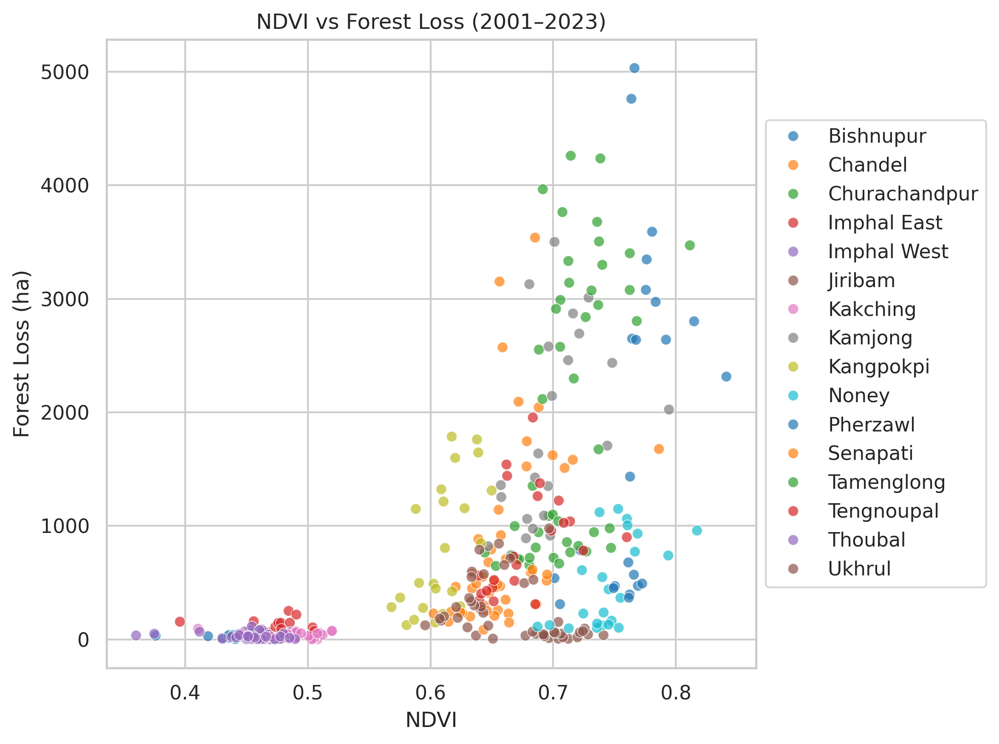

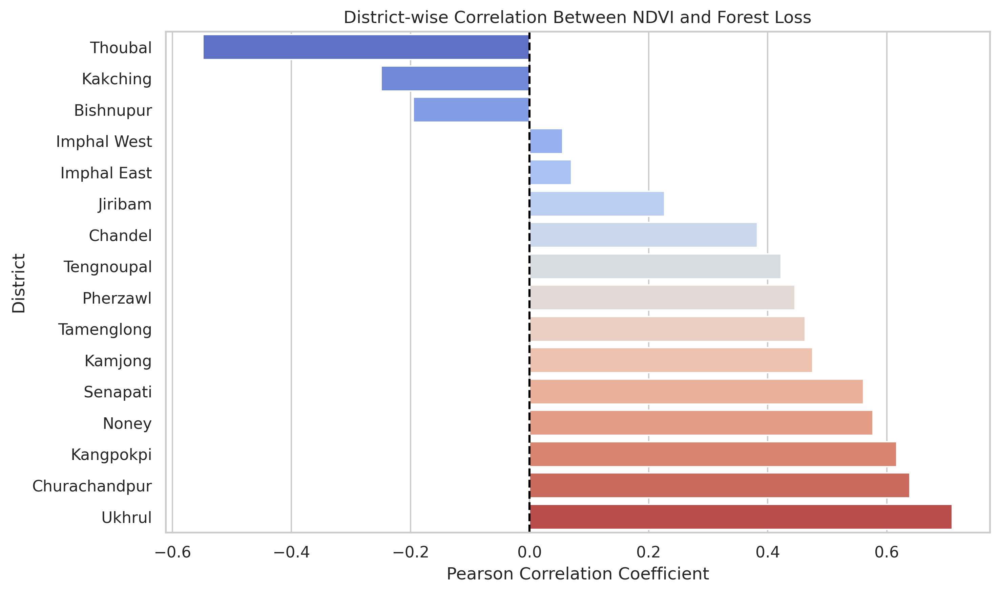

In [61]:
# 📌 Step 1: Install required libraries (if not already installed)
!pip install pandas matplotlib seaborn

# 📌 Step 2: Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set global plot style
sns.set(style='whitegrid')
plt.rcParams['figure.dpi'] = 300

# 📌 Step 3: Load your data
df = pd.read_csv("/content/manipur_forest_loss_ndvi_evi_2001_2023.csv")

# 📌 Step 4: Melt the data into long format for time series plots
long_df = df.melt(id_vars='district', var_name='metric_year', value_name='value')
long_df['type'] = long_df['metric_year'].str.extract(r'^(loss|ndvi|evi)')
long_df['year'] = long_df['metric_year'].str.extract(r'_(\d+)').astype(int)

pivot_df = long_df.pivot_table(index=['district', 'year'], columns='type', values='value').reset_index()

# 📌 Step 5: Scatter plot: NDVI vs Forest Loss (for all districts, all years)
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pivot_df, x='ndvi', y='loss', hue='district', palette='tab10', alpha=0.7)
plt.title("NDVI vs Forest Loss (2001–2023)")
plt.xlabel("NDVI")
plt.ylabel("Forest Loss (ha)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("scatter_ndvi_vs_loss.png", dpi=300)
plt.show()

# 📌 Step 6: Time Series Plot for each district (NDVI and Loss)
districts = pivot_df['district'].unique()
for district in districts:
    subset = pivot_df[pivot_df['district'] == district]
    plt.figure(figsize=(8, 4))
    sns.lineplot(data=subset, x='year', y='ndvi', label='NDVI', color='green')
    sns.lineplot(data=subset, x='year', y='loss', label='Forest Loss (ha)', color='red')
    plt.title(f"{district} - NDVI and Forest Loss Over Time")
    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.tight_layout()
    plt.savefig(f"{district.lower().replace(' ', '_')}_ndvi_loss_timeseries.png", dpi=300)
    plt.close()

# 📌 Step 7: Correlation Plot (Loss vs NDVI per district)
correlation_df = pivot_df.groupby('district').apply(
    lambda d: pd.Series({'loss_vs_ndvi_corr': d['loss'].corr(d['ndvi'])})
).reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=correlation_df.sort_values('loss_vs_ndvi_corr'), x='loss_vs_ndvi_corr', y='district', palette='coolwarm')
plt.axvline(0, color='black', linestyle='--')
plt.title("District-wise Correlation Between NDVI and Forest Loss")
plt.xlabel("Pearson Correlation Coefficient")
plt.ylabel("District")
plt.tight_layout()
plt.savefig("correlation_ndvi_loss_barplot.png", dpi=300)
plt.show()

# 📌 Done! All plots saved as high-res PNGs


PCA + Heatmap: Compare districts for similarity

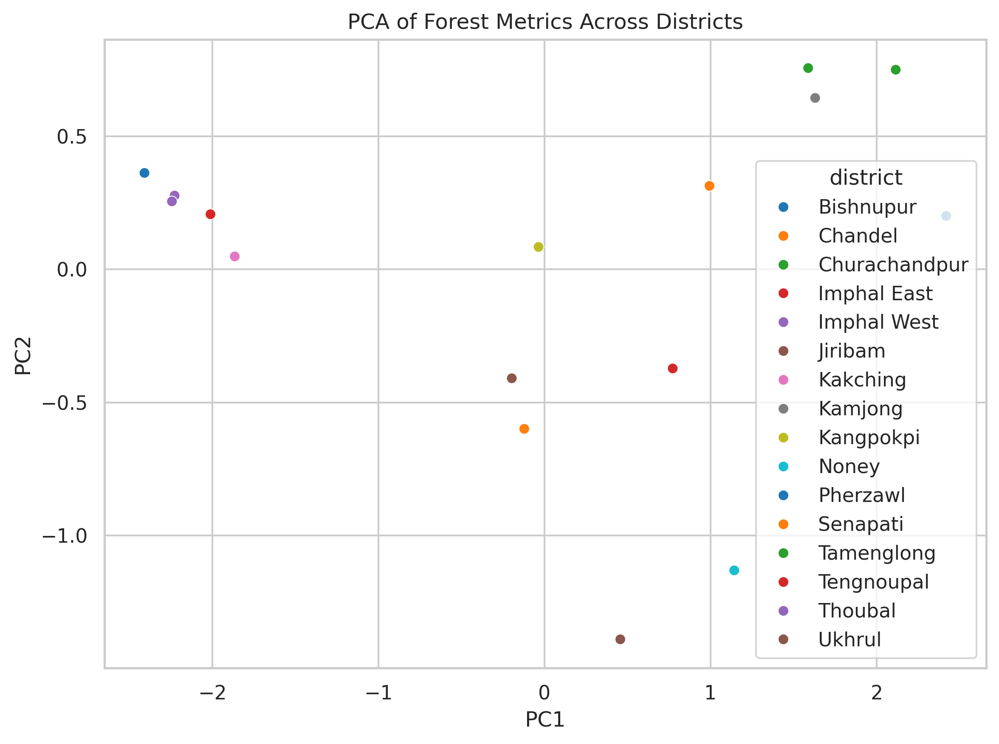

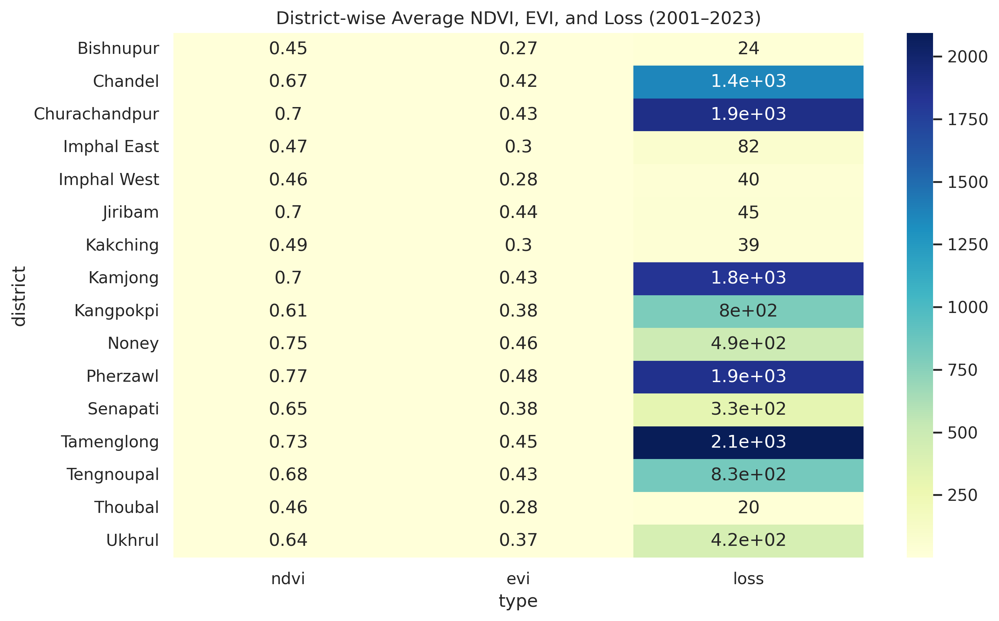

In [66]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Prepare data: average NDVI, EVI, and Loss per district
agg_df = pivot_df.groupby('district')[['ndvi', 'evi', 'loss']].mean().reset_index()
features = ['ndvi', 'evi', 'loss']
X_scaled = StandardScaler().fit_transform(agg_df[features])

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['district'] = agg_df['district']

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='district', palette='tab10')
plt.title('PCA of Forest Metrics Across Districts')
plt.tight_layout()
plt.savefig("pca_districts.png", dpi=300)
plt.show()

# Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(agg_df.set_index('district'), annot=True, cmap='YlGnBu')
plt.title('District-wise Average NDVI, EVI, and Loss (2001–2023)')
plt.tight_layout()
plt.savefig("heatmap_districts.png", dpi=300)
plt.show()


ANCOVA: Do different districts behave differently over time?

In [67]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Prepare the data
ancova_df = pivot_df.dropna(subset=['ndvi', 'loss'])  # Remove any NaNs
ancova_df['year_centered'] = ancova_df['year'] - ancova_df['year'].mean()

# ANCOVA model: Does NDVI over time differ by district?
model = ols('ndvi ~ year_centered * C(district)', data=ancova_df).fit()
table = sm.stats.anova_lm(model, typ=2)
print(table)


                             sum_sq     df           F         PR(>F)
C(district)                4.445338   15.0  608.329551  4.179095e-233
year_centered              0.047828    1.0   98.175892   1.795337e-20
year_centered:C(district)  0.050699   15.0    6.938043   3.579084e-13
Residual                   0.163687  336.0         NaN            NaN


Trend Test per District: Is NDVI increasing/decreasing?

In [68]:
from scipy.stats import linregress

trend_results = []
for district in districts:
    subset = pivot_df[pivot_df['district'] == district]
    result = linregress(subset['year'], subset['ndvi'])
    trend_results.append({
        'district': district,
        'slope': result.slope,
        'pvalue': result.pvalue,
        'trend': 'increasing' if result.slope > 0 else 'decreasing'
    })

trend_df = pd.DataFrame(trend_results)
print(trend_df.sort_values('slope'))


         district     slope    pvalue       trend
0       Bishnupur -0.001193  0.147290  decreasing
14        Thoubal -0.001154  0.134195  decreasing
6        Kakching -0.000926  0.233331  decreasing
4     Imphal West -0.000403  0.632033  decreasing
3     Imphal East  0.000206  0.766736  increasing
5         Jiribam  0.001449  0.050380  increasing
8       Kangpokpi  0.002294  0.000137  increasing
12     Tamenglong  0.002340  0.011531  increasing
11       Senapati  0.002433  0.000503  increasing
9           Noney  0.002551  0.001635  increasing
10       Pherzawl  0.002616  0.003010  increasing
2   Churachandpur  0.002670  0.000202  increasing
15         Ukhrul  0.002853  0.000013  increasing
1         Chandel  0.003827  0.000067  increasing
13     Tengnoupal  0.003867  0.000001  increasing
7         Kamjong  0.004069  0.000001  increasing


Regression: Quantify how NDVI affects Forest Loss

In [69]:
import statsmodels.api as sm

# Prepare X and y
regression_df = pivot_df.dropna(subset=['ndvi', 'loss'])
X = sm.add_constant(regression_df['ndvi'])
y = regression_df['loss']

# Fit model
model = sm.OLS(y, X).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                   loss   R-squared:                       0.328
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     178.6
Date:                Sun, 15 Jun 2025   Prob (F-statistic):           1.89e-33
Time:                        13:04:14   Log-Likelihood:                -2997.9
No. Observations:                 368   AIC:                             6000.
Df Residuals:                     366   BIC:                             6008.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2434.5700    242.907    -10.023      0.0

Moran Scatterplot result is from spatial autocorrelation analysis (specifically using Moran’s I),

In [72]:
# Rename 'shapeName' to 'district' to match with pivot_df
gdf = gdf.rename(columns={"shapeName": "district"})

# Group average forest loss per district
loss_avg_df = pivot_df.groupby("district")[["loss"]].mean().reset_index()

# Merge GeoDataFrame with forest loss data
gdf = gdf.merge(loss_avg_df, on="district")


In [74]:
!pip install esda splot


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.8/142.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.8/322.8 kB 22.2 MB/s eta 0:00:00


Moran’s I: 0.014694052928777498
p-value: 0.261


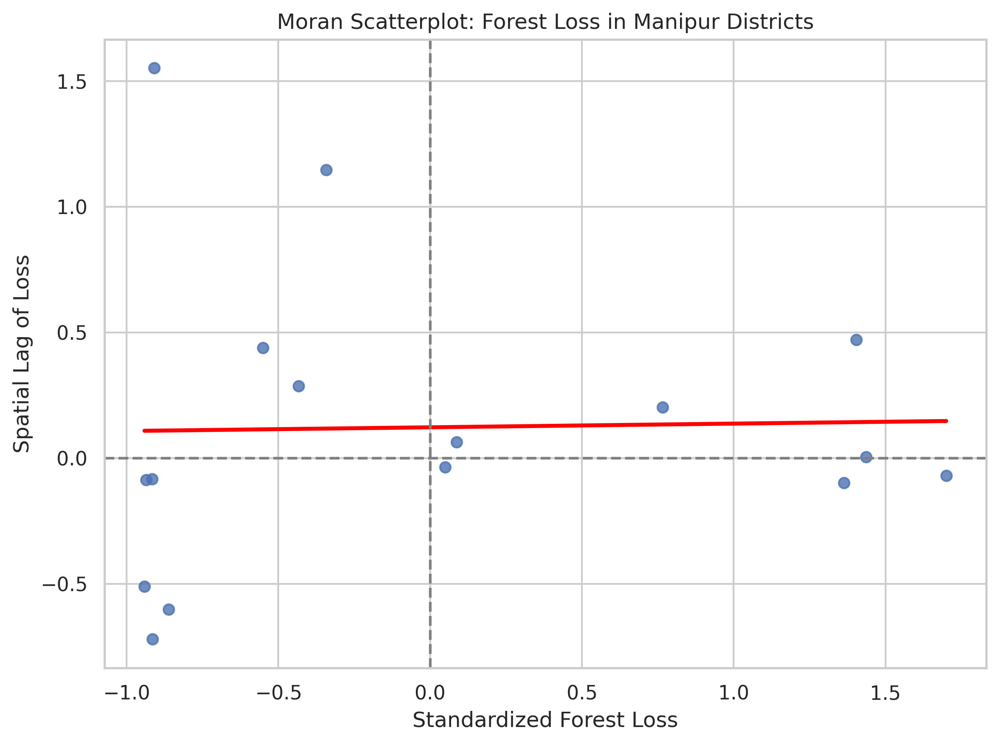

In [76]:
# Install if not already installed
!pip install esda libpysal

# Imports
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from esda.moran import Moran
import libpysal
import numpy as np

# Load and prepare GeoDataFrame
gdf = gpd.read_file("/content/manipur_districts.geojson")
gdf = gdf.rename(columns={"shapeName": "district"})

# Merge average forest loss
loss_avg_df = pivot_df.groupby("district")[["loss"]].mean().reset_index()
gdf = gdf.merge(loss_avg_df, on="district")
gdf = gdf.set_index("district")
gdf = gdf.dropna(subset=["loss"])

# Queen contiguity weights
w = libpysal.weights.Queen.from_dataframe(gdf)
w.transform = 'r'

# Moran’s I
moran = Moran(gdf["loss"], w)
print("Moran’s I:", moran.I)
print("p-value:", moran.p_sim)

# Manual Moran scatterplot
z = (gdf["loss"] - gdf["loss"].mean()) / gdf["loss"].std()
wz = libpysal.weights.spatial_lag.lag_spatial(w, z)

plt.figure(figsize=(8, 6))
sns.regplot(x=z, y=wz, ci=None, line_kws={"color": "red"})
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.xlabel("Standardized Forest Loss")
plt.ylabel("Spatial Lag of Loss")
plt.title("Moran Scatterplot: Forest Loss in Manipur Districts")
plt.tight_layout()
plt.savefig("moran_scatterplot_forest_loss.png", dpi=300)
plt.show()


In [77]:
# Standardize the forest loss values
z = (gdf["loss"] - gdf["loss"].mean()) / gdf["loss"].std()
wz = libpysal.weights.spatial_lag.lag_spatial(w, z)

# Assign quadrant based on z and wz signs
def classify_quadrant(row):
    if row['z'] > 0 and row['wz'] > 0:
        return "High-High (Hotspot)"
    elif row['z'] < 0 and row['wz'] < 0:
        return "Low-Low (Coldspot)"
    elif row['z'] < 0 and row['wz'] > 0:
        return "Low-High (Outlier)"
    elif row['z'] > 0 and row['wz'] < 0:
        return "High-Low (Outlier)"
    else:
        return "Undefined"

# Create a DataFrame with district, z, wz, and quadrant
moran_df = pd.DataFrame({
    "district": gdf.index,
    "z": z,
    "wz": wz
})
moran_df["quadrant"] = moran_df.apply(classify_quadrant, axis=1)

# Display result
moran_df_sorted = moran_df.sort_values("quadrant")
print(moran_df_sorted)


                    district         z        wz             quadrant
district                                                             
Chandel              Chandel  0.766396  0.202160  High-High (Hotspot)
Churachandpur  Churachandpur  1.435685  0.004165  High-High (Hotspot)
Pherzawl            Pherzawl  1.403716  0.471092  High-High (Hotspot)
Tengnoupal        Tengnoupal  0.087779  0.064406  High-High (Hotspot)
Tamenglong        Tamenglong  1.700257 -0.069909   High-Low (Outlier)
Kangpokpi          Kangpokpi  0.049859 -0.035801   High-Low (Outlier)
Kamjong              Kamjong  1.364137 -0.098604   High-Low (Outlier)
Ukhrul                Ukhrul -0.433449  0.287483   Low-High (Outlier)
Noney                  Noney -0.342397  1.147379   Low-High (Outlier)
Senapati            Senapati -0.551547  0.438889   Low-High (Outlier)
Jiribam              Jiribam -0.909178  1.551987   Low-High (Outlier)
Bishnupur          Bishnupur -0.935601 -0.086586   Low-Low (Coldspot)
Thoubal             

In [78]:
import geopandas as gpd
import pandas as pd
from esda.moran import Moran_Local
from libpysal.weights import Queen
import matplotlib.pyplot as plt
import seaborn as sns

# Load shapefile
gdf = gpd.read_file("/content/manipur_districts.geojson")

# Load pivot_df with 'district', 'loss', 'ndvi', 'evi' from your earlier analysis
pivot_df_avg = pivot_df.groupby("district")[["loss", "ndvi", "evi"]].mean().reset_index()

# Join GeoDataFrame and DataFrame
gdf["district"] = gdf["shapeName"]
gdf = gdf.merge(pivot_df_avg, on="district")


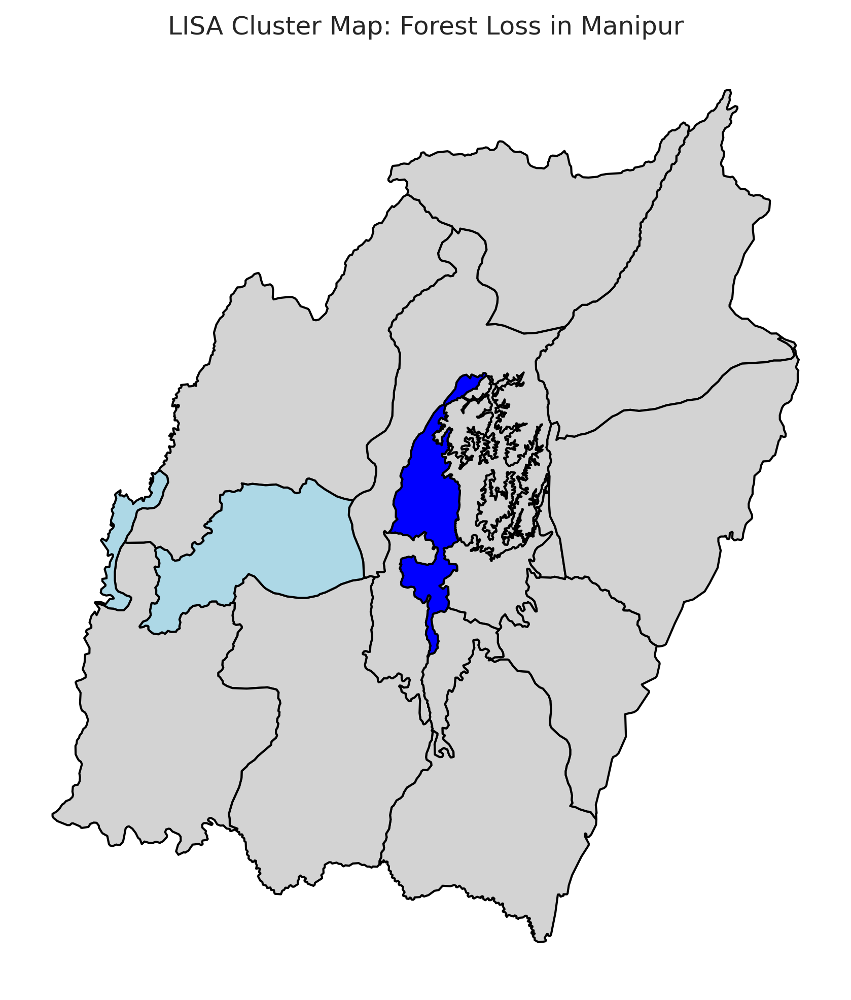

In [79]:
from matplotlib import colors

# Create spatial weights matrix
w = Queen.from_dataframe(gdf)
w.transform = 'r'

# Run Local Moran's I
lisa = Moran_Local(gdf["loss"], w)

# Add LISA results to GeoDataFrame
gdf["lisa_cluster"] = lisa.q  # 1=HH, 2=LH, 3=LL, 4=HL
gdf["lisa_sig"] = lisa.p_sim < 0.05  # significance

# Create color mapping
lisa_colors = {
    1: "red",     # High-High (hotspot)
    2: "lightblue", # Low-High (outlier)
    3: "blue",    # Low-Low (coldspot)
    4: "orange"   # High-Low (outlier)
}
gdf["color"] = gdf.apply(lambda row: lisa_colors.get(row["lisa_cluster"]) if row["lisa_sig"] else "lightgrey", axis=1)

# Plot LISA Cluster Map
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(ax=ax, color=gdf["color"], edgecolor="black")
plt.title("LISA Cluster Map: Forest Loss in Manipur")
plt.axis("off")
plt.show()


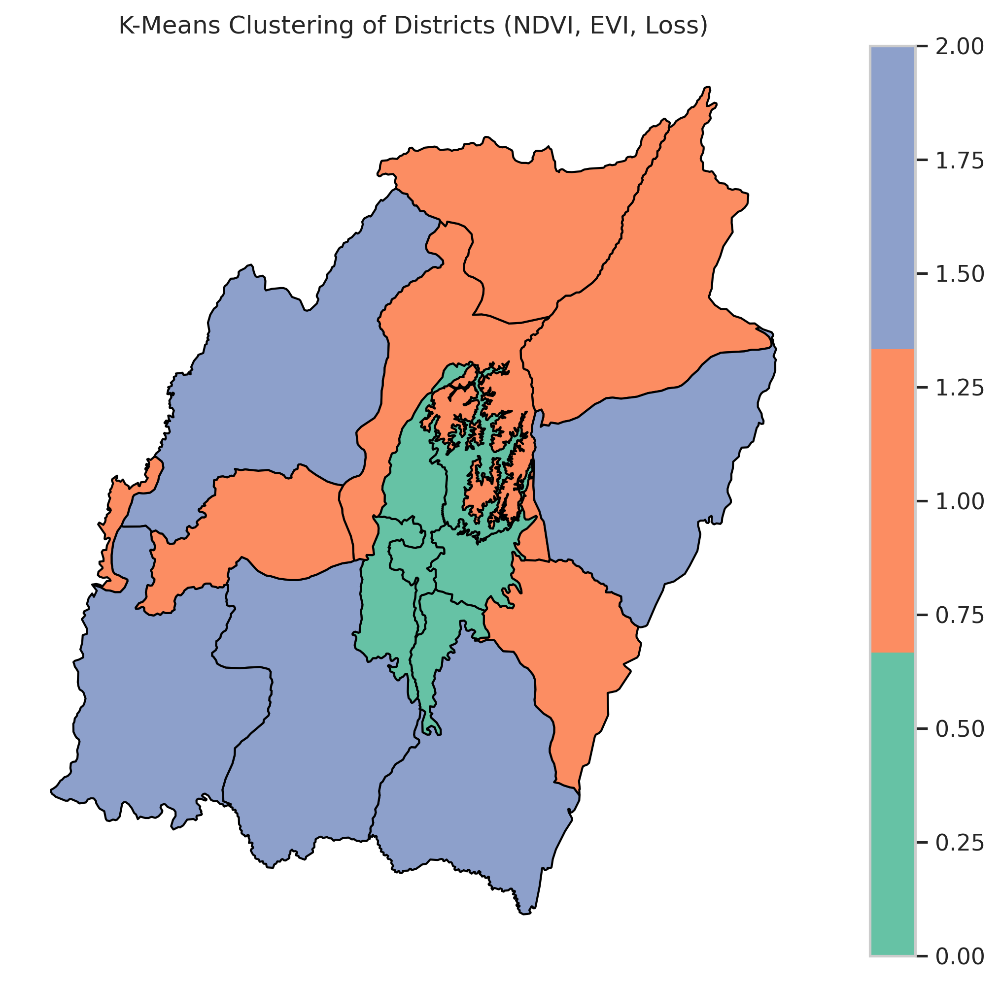

Cluster Centers (original scale):
        ndvi       evi         loss
0  0.466047  0.287279    40.825855
1  0.670017  0.410409   484.002753
2  0.711472  0.441127  1806.130580


In [80]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Prepare feature matrix
features = gdf[["ndvi", "evi", "loss"]]
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Run K-Means (try k=3 for initial analysis)
kmeans = KMeans(n_clusters=3, random_state=42)
gdf["kmeans_cluster"] = kmeans.fit_predict(scaled_features)

# Plot clusters on map
cluster_palette = sns.color_palette("Set2", n_colors=3)
gdf.plot(column="kmeans_cluster", cmap=colors.ListedColormap(cluster_palette), legend=True, edgecolor='black', figsize=(10, 8))
plt.title("K-Means Clustering of Districts (NDVI, EVI, Loss)")
plt.axis("off")
plt.show()

# Optional: Print cluster centers
cluster_centers = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=["ndvi", "evi", "loss"])
print("Cluster Centers (original scale):\n", cluster_centers)


In [81]:
# Check the GeoDataFrame you used for LISA and KMeans
# Example: If it's called `gdf`

# For LISA Clusters
print("🔷 LISA High-High Clusters (High forest loss)")
print(gdf[gdf['lisa_cluster'] == 'HH']['shapeName'])

print("\n🔹 LISA Low-Low Clusters (Low forest loss)")
print(gdf[gdf['lisa_cluster'] == 'LL']['shapeName'])

# For KMeans Clusters
print("\n🔶 KMeans Clustering of Districts (by Cluster ID)")
for cluster_id in sorted(gdf['kmeans_cluster'].unique()):
    print(f"\nCluster {cluster_id}:")
    print(gdf[gdf['kmeans_cluster'] == cluster_id]['shapeName'].tolist())


🔷 LISA High-High Clusters (High forest loss)
Series([], Name: shapeName, dtype: object)

🔹 LISA Low-Low Clusters (Low forest loss)
Series([], Name: shapeName, dtype: object)

🔶 KMeans Clustering of Districts (by Cluster ID)

Cluster 0:
['Bishnupur', 'Thoubal', 'Imphal East', 'Imphal West', 'Kakching']

Cluster 1:
['Ukhrul', 'Kangpokpi', 'Noney', 'Tengnoupal', 'Senapati', 'Jiribam']

Cluster 2:
['Chandel', 'Tamenglong', 'Churachandpur', 'Pherzawl', 'Kamjong']
